In [ ]:
pip install geopy


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
import plotly.graph_objects as go


In [ ]:
#chargement de données :
try :
    data = pd.read_csv(f"C:/Users/cheba/OneDrive/Bureau/MPDS2/virtualisation de donnes massives IOT mme ghada/projet/Projet-Dashboard-S-ismes/database.csv",sep=',')
except Exception as e:
    print(f"error lors de l'ouverture du fichier :{e}")
print(data.head())

         Date      Time  Latitude  Longitude        Type  Depth  Depth Error  \
0  01/02/1965  13:44:18    19.246    145.616  Earthquake  131.6          NaN   
1  01/04/1965  11:29:49     1.863    127.352  Earthquake   80.0          NaN   
2  01/05/1965  18:05:58   -20.579   -173.972  Earthquake   20.0          NaN   
3  01/08/1965  18:49:43   -59.076    -23.557  Earthquake   15.0          NaN   
4  01/09/1965  13:32:50    11.938    126.427  Earthquake   15.0          NaN   

   Depth Seismic Stations  Magnitude Magnitude Type  ...  \
0                     NaN        6.0             MW  ...   
1                     NaN        5.8             MW  ...   
2                     NaN        6.2             MW  ...   
3                     NaN        5.8             MW  ...   
4                     NaN        5.8             MW  ...   

   Magnitude Seismic Stations  Azimuthal Gap  Horizontal Distance  \
0                         NaN            NaN                  NaN   
1                   

In [ ]:
#nettoyage des données :
#remplacer les colones vides par des 0 pour faciliter les calculs
data = data.replace(['', ' '], 0 )

700.0,-1.1,9.1,5.5


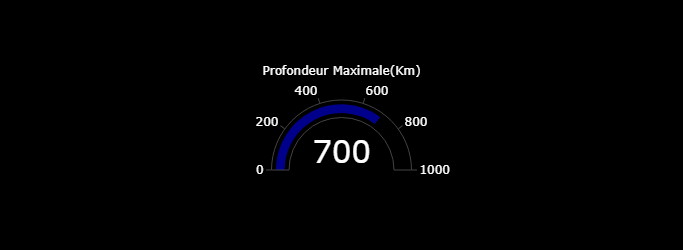

In [ ]:

# Calculating max and min values
max_depth = data['Depth'].max()
min_depth = data['Depth'].min()
max_magnitude = data['Magnitude'].max()
min_magnitude = data['Magnitude'].min()
print(max_depth,min_depth,max_magnitude,min_magnitude,sep=',')
# Import Plotly gauge chart
import plotly.graph_objects as go

# Gauge chart for Max Depth
gauge_max_depth = go.Figure(go.Indicator(
  mode="gauge+number",
    value=max_depth,
    title={'text': "Profondeur Maximale(Km)" ,'font': {'size': 12}},
    gauge={'axis': {'range': [0, 1000]}, 'bar': {'color': "darkblue"}},
))
gauge_max_depth.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white")
)
gauge_max_depth.update_layout(height=250)
gauge_max_depth.show()


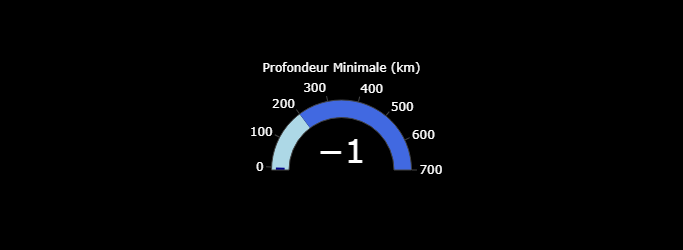

In [ ]:

# Gauge chart for Min Depth
gauge_depth_min = go.Figure(go.Indicator(
    mode="gauge+number",
    value=min_depth,
    title={'text': "Profondeur Minimale (km)" ,'font': {'size': 12}},
    gauge={
        'axis': {'range': [-10, 700]},  # Échelle de profondeur (ex : 0-700 km)
        'bar': {'color': "darkblue"},
        'steps': [
            {'range': [-10, 200], 'color': 'lightblue'},
            {'range': [200, 700], 'color': 'royalblue'},

        ]
    }
))
gauge_depth_min.update_layout(height=250,
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white")  # Texte en blanc pour une meilleure lisibilité
)


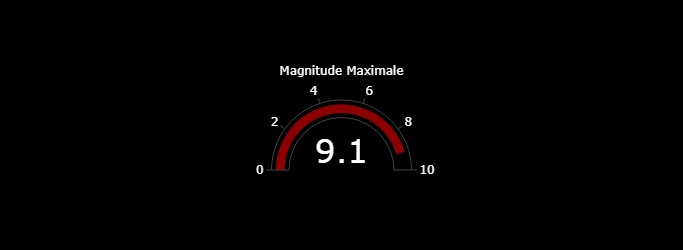

In [ ]:

# Gauge chart for Max Magnitude
gauge_max_magnitude = go.Figure(go.Indicator(
    mode="gauge+number",
    value=max_magnitude,
    title={'text': "Magnitude Maximale" ,'font': {'size': 12}},
    gauge={'axis': {'range': [0, 10]}, 'bar': {'color': "darkred"}},
))
gauge_max_magnitude.update_layout(height=250 ,

    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white")  # Texte en blanc pour une meilleure lisibilité
)
gauge_max_magnitude.show()


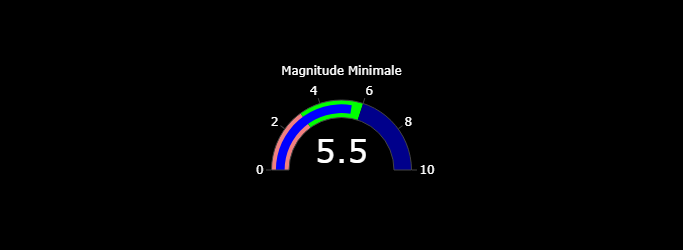

In [ ]:

# Gauge chart for Min Magnitude
gauge_min_magnitude = go.Figure(go.Indicator(
    mode="gauge+number",
    value=min_magnitude,
    title={'text': "Magnitude Minimale",'font': {'size': 12}},
    gauge={
        'axis': {'range': [0, 10]},  # Échelle de magnitude (0-10)
        'bar': {'color': "blue"},
        'steps': [
            {'range': [0, 3], 'color': 'lightcoral'},
            {'range': [3, 6], 'color': 'lime'},
            {'range': [6, 10], 'color': 'darkblue'}
        ]
    }
))
gauge_min_magnitude.update_layout(height=250 ,
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white")  # Texte en blanc pour une meilleure lisibilité
)
gauge_min_magnitude.show()

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

def carte_narrative_seismes(data):
    """
    Transforme les données techniques de séismes en une carte narrative compréhensible.

    Args:
    data (pd.DataFrame): DataFrame des données sismiques

    Returns:
    plotly.graph_objects.Figure: Visualisation intuitive des séismes
    """
    # Définir des régions géographiques avec des noms parlants
    def mapper_region(longitude, latitude):
        regions = {
            'Amérique du Nord': (-130, -70, 20, 70),
            'Amérique du Sud': (-80, -35, -60, 10),
            'Europe': (-10, 40, 35, 70),
            'Afrique': (-20, 50, -35, 35),
            'Asie': (60, 150, 0, 70),
            'Océanie': (110, 180, -50, 10),
            'Océan Pacifique': (-180, -100, -30, 30),
            'Région Méditerranéenne': (-10, 50, 20, 45)
        }

        for nom, (lon_min, lon_max, lat_min, lat_max) in regions.items():
            if lon_min <= longitude <= lon_max and lat_min <= latitude <= lat_max:
                return nom
        return 'Autres régions'

    # Ajouter une colonne de régions narratives
    data['Region_Narrative'] = data.apply(lambda row: mapper_region(row['Longitude'], row['Latitude']), axis=1)

    # Grouper par région et calculer des statistiques
    stats_regionales = data.groupby('Region_Narrative').agg({
        'Magnitude': ['count', 'mean', 'max'],
        'Depth': 'mean'
    }).reset_index()

    stats_regionales.columns = ['Region', 'Nombre_Seismes', 'Magnitude_Moyenne', 'Magnitude_Max', 'Profondeur_Moyenne']

    # Créer une visualisation intuitive
    fig = px.scatter(
        stats_regionales,
        x='Nombre_Seismes',
        y='Magnitude_Moyenne',
        size='Nombre_Seismes',
        color='Magnitude_Max',
        hover_data={
            'Region': True,
            'Nombre_Seismes': ':.0f',
            'Magnitude_Moyenne': ':.2f',
            'Magnitude_Max': ':.2f',
            'Profondeur_Moyenne': ':.2f'
        },
        labels={
            'Nombre_Seismes': 'Fréquence des Séismes',
            'Magnitude_Moyenne': 'Intensité Moyenne',
            'Region': 'Zone Géographique'
        },
        title="Histoire Sismique Mondiale (1965-2016)"
    )

    # Annotations et personnalisation
    fig.update_layout(
        height=450,
        width=400,
        paper_bgcolor="black",  # Fond de la figure
        plot_bgcolor="black",   # Fond du graphe
        font=dict(color="white") , # Texte en blanc pour une meilleure lisibilité
        xaxis=dict(showgrid=False),  # Désactiver les grilles pour l'axe X
        yaxis=dict(showgrid=False),# Désactiver les grilles pour l'axe Y
        title={
        'text': "Histoire Sismique Mondiale (1965-2016)",  # Texte du titre
        'font': {'size': 12}          # Taille du titre
    }




)


    return fig
f=carte_narrative_seismes(data)
print(f)

# Exemple d'utilisation (à adapter avec votre DataFrame)
# carte_narrative = carte_narrative_seismes(data)
# carte_narrative.show()

Figure({
    'data': [{'customdata': array([['Afrique', 7.2, 15.625982142857143],
                                   ['Amérique du Nord', 7.3, 11.398605898123325],
                                   ['Amérique du Sud', 8.8, 90.43600114744693],
                                   ['Asie', 9.1, 67.11151917649012],
                                   ['Autres régions', 8.7, 34.987631621317014],
                                   ['Europe', 7.6, 31.34948012232416],
                                   ['Océan Pacifique', 8.1, 152.72877428998507],
                                   ['Océanie', 8.2, 79.21801804670913],
                                   ['Région Méditerranéenne', 7.4, 20.729577464788733]], dtype=object),
              'hovertemplate': ('Fréquence des Séismes=%{marker' ... 'tomdata[2]:.2f}<extra></extra>'),
              'legendgroup': '',
              'marker': {'color': array([7.2, 7.3, 8.8, 9.1, 8.7, 7.6, 8.1, 8.2, 7.4]),
                         'coloraxis': 'coloraxis',
   

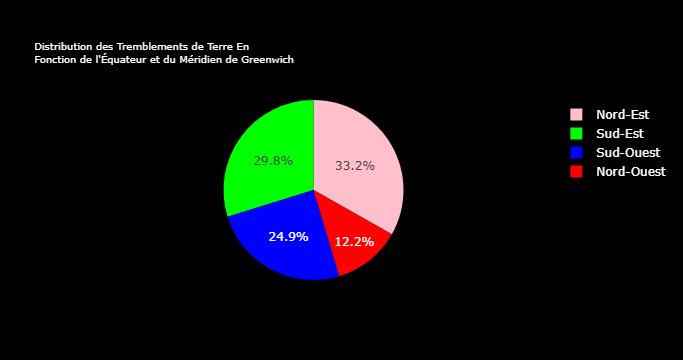

In [ ]:
#distribution des Tremblements de terre par rapport à l'équateur & méridien Greenwich:
#déterminer les regions:
nord_est= data[(data['Latitude'] > 0) & (data['Longitude'] > 0)]
nord_oest = data[(data['Latitude'] > 0) & (data['Longitude'] <0)]
sud_est = data[(data['Latitude'] < 0) & (data['Longitude'] > 0)]
sud_oest = data[(data['Latitude'] < 0) & (data['Longitude'] < 0)]
#calculer le nombre de tremblement par région (n_T *100)/N_totale_T:
x=(len(nord_est)*100)/len(data)
y=(len(nord_oest)*100)/len(data)
z=(len(sud_est)*100)/len(data)
t=(len(sud_oest)*100)/len(data)
#visualisation :
v2 = px.pie(values=[x, y, z, t],
            names=['Nord-Est', 'Nord-Ouest', 'Sud-Est', 'Sud-Ouest'],
            title="Distribution des Tremblements de Terre En <br>Fonction de l'Équateur et du Méridien de Greenwich ",

            color_discrete_sequence=['pink', 'lime', 'blue', 'red'])
v2.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    title={
        'text': "Distribution des Tremblements de Terre En <br>Fonction de l'Équateur et du Méridien de Greenwich ",  # Texte du titre
        'font': {'size': 10}          # Taille du titre
    }
)
v2.show()

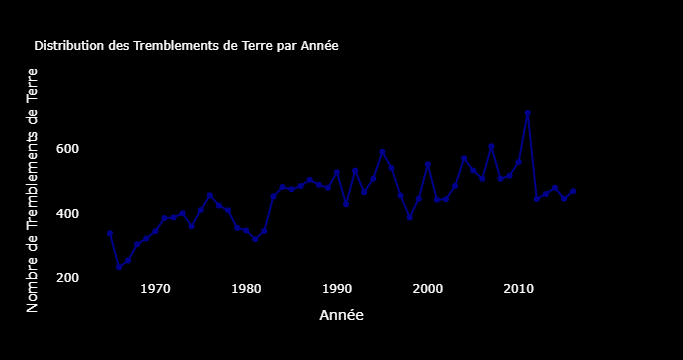

In [ ]:
# Assurer que la colonne 'Date' est en format datetime
data['Date'] = pd.to_datetime(data['Date'], errors='coerce')

# Extraire l'année à partir de la colonne 'Date'
data['Year'] = data['Date'].dt.year

# Distribution des tremblements de terre par année
earthquakes_per_year = data.groupby('Year').size().reset_index(name='n_Troublements')

# Visualisation: Line Plot de tremblements de terre par année
v3 = px.line(earthquakes_per_year, x='Year', y='n_Troublements',
             labels={'Year': 'Année', 'n_Troublements': 'Nombre de Tremblements de Terre'},
             title="Distribution des Tremblements de Terre par Année"
            )

# Ajouter des marqueurs pour chaque point sur la ligne
v3.update_traces(mode='lines+markers',line=dict(color='darkblue'))
v3.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    xaxis=dict(showgrid=False),  # Désactiver les grilles pour l'axe X
    yaxis=dict(showgrid=False),# Désactiver les grilles pour l'axe X
    title={
        'text': "Distribution des Tremblements de Terre par Année",  # Texte du titre
        'font': {'size': 12}          # Taille du titre
    }
)
v3.show()

Le mois avec le plus grand nombre de tremblements de terre est : Mois 3 avec 2113 tremblements.


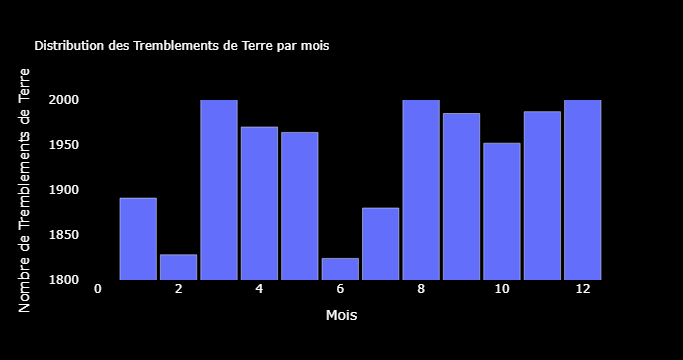

In [ ]:
# Extraire le mois à partir de la colonne 'Date'
data['Month'] = data['Date'].dt.month

# Distribution des tremblements de terre par mois
earthquakes_per_month = data.groupby('Month').size().reset_index(name='n_Troublements')

# Identifier le mois avec le plus grand nombre de tremblements de terre
max_month = earthquakes_per_month.loc[earthquakes_per_month['n_Troublements'].idxmax()]

print(f"Le mois avec le plus grand nombre de tremblements de terre est : Mois {int(max_month['Month'])} avec {int(max_month['n_Troublements'])} tremblements.")

# Visualisation: Histogramme de tremblements de terre par mois
v4 = px.bar(earthquakes_per_month, x='Month', y='n_Troublements',
            labels={'Month': 'Mois', 'n_Troublements': 'Nombre de Tremblements de Terre'},
            title="Distribution des Tremblements de Terre par Mois")

# Ajouter une annotation pour mettre en évidence le mois le plus actif
v4.add_annotation(x=max_month['Month'], y=max_month['n_Troublements'],
                  text=f"Le mois le plus actif ({int(max_month['n_Troublements'])} tremblements)",
                  showarrow=True, arrowhead=2)
v4.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    xaxis=dict(showgrid=False),  # Désactiver les grilles pour l'axe X
    yaxis=dict(
        showgrid=False,  # Désactiver les grilles pour l'axe Y
        range=[1800, 2000]  # Définir la plage de l'axe Y
    ),
    bargap=0.1,  # Espacement entre les barres
    title={
        'text': "Distribution des Tremblements de Terre par mois",  # Texte du titre
        'font': {'size': 12}          # Taille du titre
    }

)

v4.show()

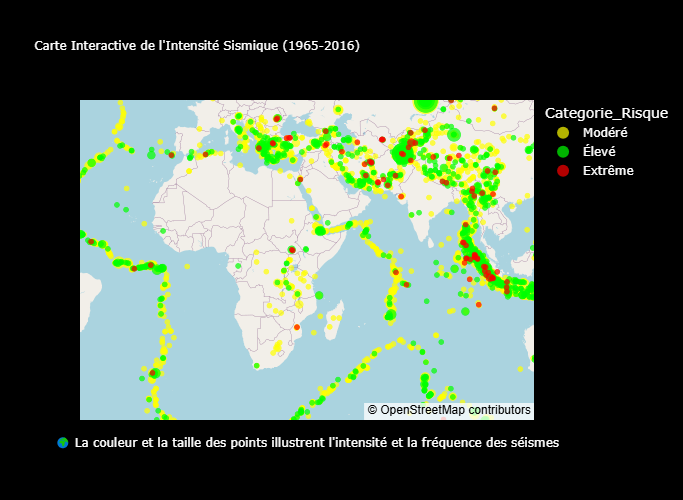

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

def visualisation_intensite_sismique(data):
    """
    Création d'une visualisation géographique de l'intensité sismique
    avec des informations contextuelles et détaillées.

    Args:
    data (pd.DataFrame): DataFrame contenant les données sismiques

    Returns:
    plotly.graph_objects.Figure: Carte interactive de l'intensité sismique
    """
    # Regroupement géographique avec plus de contexte
    def categoriser_risque(magnitude):
        if  4 <= magnitude <5:
            return 'Faible'
        elif 5 <= magnitude < 6:
            return 'Modéré'
        elif 6 <= magnitude < 7:
            return 'Élevé'
        else:
            return 'Extrême'

    # Préparation des données
    data['region_latitude'] = data['Latitude'].apply(lambda x: round(x, 1))
    data['region_longitude'] = data['Longitude'].apply(lambda x: round(x, 1))

    # Calculs statistiques enrichis
    magnitude_stats = data.groupby(['region_latitude', 'region_longitude']).agg({
        'Magnitude': ['mean', 'max', 'count']
    }).reset_index()

    # Aplatissement des colonnes multilevels
    magnitude_stats.columns = ['Latitude', 'Longitude', 'Magnitude_Moyenne', 'Magnitude_Max', 'Nombre_Seismes']

    # Ajout de la catégorisation du risque
    magnitude_stats['Categorie_Risque'] = magnitude_stats['Magnitude_Moyenne'].apply(categoriser_risque)

    # Création de la visualisation
    fig = px.scatter_mapbox(
        magnitude_stats,
        lat='Latitude',
        lon='Longitude',
        color='Categorie_Risque',
        size='Nombre_Seismes',
        hover_name='Categorie_Risque',
        hover_data={
            'Latitude': ':.1f',
            'Longitude': ':.1f',
            'Magnitude_Moyenne': ':.2f',
            'Magnitude_Max': ':.2f',
            'Nombre_Seismes': ':.0f',
            'Categorie_Risque': True
        },
        color_discrete_map={
            'Faible': 'blue',
            'Modéré': 'yellow',
            'Élevé': 'lime',
            'Extrême': 'red'
        },
        title='Carte Interactive de l\'Intensité Sismique (1965-2016)',
        zoom=1,
        mapbox_style="open-street-map"
    )

    # Personnalisation de la mise en page
    fig.update_layout(
        height=500,
        width=800,
        annotations=[
            go.layout.Annotation(
                text="🌍 La couleur et la taille des points illustrent l'intensité et la fréquence des séismes",
                xref="paper",
                yref="paper",
                x=0.5,
                y=-0.1,
                showarrow=False
            )
        ],

        paper_bgcolor="black",  # Fond de la figure
        plot_bgcolor="black",   # Fond du graphe
        font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
        title={
        'text': "Carte Interactive de l\'Intensité Sismique (1965-2016)",  # Texte du titre
        'font': {'size': 12}          # Taille du titre
    }

)


    return fig
# Générez la visualisation
v6 = visualisation_intensite_sismique(data)
v6.show()


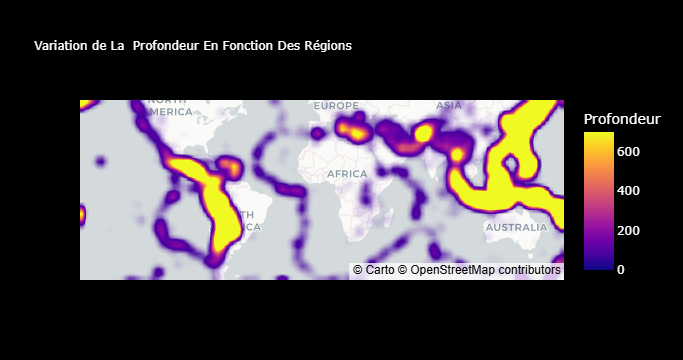

In [ ]:
#intensité de profondeur par région :
#profondeur moyenne par region :
mean_depth=data.groupby(['region_latitude','region_longitude'])['Depth'].mean().reset_index()
mean_depth.columns = ['Latitude', 'Longitude', 'Profondeur']
#carte de chaleur :
v7 = px.density_mapbox(mean_depth, lat='Latitude', lon='Longitude', z='Profondeur',
                         radius=10,
                         center=dict(lat=0, lon=0),
                         zoom=0,
                         mapbox_style="carto-positron",
                         title='Variation de La  Profondeur En<br> Fonction Des Régions')
v7.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    xaxis=dict(showgrid=False),  # Désactiver les grilles pour l'axe X
    yaxis=dict(showgrid=False),# Désactiver les grilles pour l'axe X
    title={
        'text': "Variation de La  Profondeur En Fonction Des Régions",  # Texte du titre
        'font': {'size': 12} }         # Taille du titre


)
v7.show()

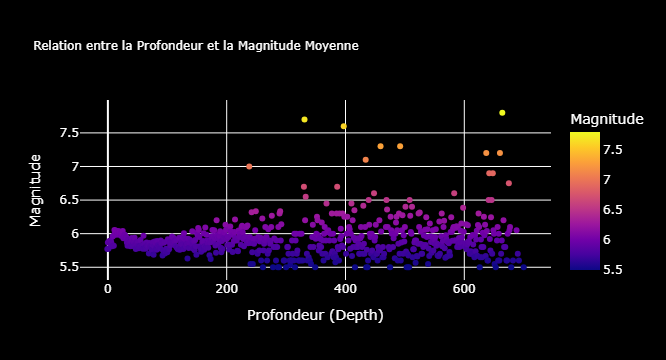

In [ ]:
# Creating the rounded depth column 'D'
data['D']= data['Depth'].apply(lambda x : round(x))

# Calculating the average magnitude for each rounded depth value
avg_magnitude_per_depth = data.groupby('D')['Magnitude'].mean().reset_index()

# Scatter plot of Depth vs Magnitude
fig_depth_magnitude = px.scatter(avg_magnitude_per_depth, x='D', y='Magnitude',
                                 color='Magnitude',
                                 labels={'D': 'Profondeur (Depth)', 'Magnitude': 'Magnitude '},
                                 title="Relation entre la Profondeur et la Magnitude Moyenne")
fig_depth_magnitude.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    title={
        'text': "Relation entre la Profondeur et la Magnitude Moyenne",  # Texte du titre
        'font': {'size': 12} }


)

fig_depth_magnitude.show()


In [ ]:
def Year_statistics(year):
    x=data[data['Year']==year]
    return x
def get_information(year):
    y=Year_statistics(year)
    a=y['Depth'].max()
    b=y['Depth'].min()
    c=y['Magnitude'].max()
    d=y['Magnitude'].min()
    return {
        'max_depth': a,
        'min_depth': b,
        'max_magnitude': c,
        'min_magnitude': d }
def gauge(year,n):
    x=get_information(year)
    y=""
    if n=='max_depth':
        y="darkblue"
    elif n=='max_magnitude':
        y="darkred"
    elif n=='min_depth':
        y= "skyblue"
    else :
        y= "lime"
    gauge = go.Figure(go.Indicator(
        mode="gauge+number",
        value=x[n],
        title={'text': f"{n}",'font':{'size':12}},

        gauge={'axis': {'range': [0,x[n]+10]},'bar': {'color': y}}
    ))
    gauge.update_layout(height=250 ,
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white")  # Texte en blanc pour une meilleure lisibilité
)
    return gauge


In [ ]:
def month(year):
    x = Year_statistics(year)
    y = x.groupby('Month').size().reset_index(name='n_t')
    presentation = px.bar(
                            y=y['Month'],
                            x=y['n_t'],
                            title="Evolution des Seismes par Mois",
                            color=y['n_t'],
                            orientation='h',
                            color_continuous_scale='Viridis',
                            labels={'y': 'Mois', 'x': 'N_Seisme' ,'color':'N_Seisme'}
    )
    presentation.update_layout(height=400 ,
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False)) # Texte en blanc pour une meilleure lisibilité
    return presentation
print(month(1965))


Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'N_Seisme=%{marker.color}<br>Mois=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': array([13, 54, 38, 33, 22, 32, 21, 34, 28, 17, 27, 20], dtype=int64),
                         'coloraxis': 'coloraxis',
                         'pattern': {'shape': ''}},
              'name': '',
              'offsetgroup': '',
              'orientation': 'h',
              'showlegend': False,
              'textposition': 'auto',
              'type': 'bar',
              'x': array([13, 54, 38, 33, 22, 32, 21, 34, 28, 17, 27, 20], dtype=int64),
              'xaxis': 'x',
              'y': array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.]),
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'coloraxis': {'colorbar': {'title': {'text': 'N_Seisme'}},
                             'colorscale': [[0.0, '#440154'], [0.1111111111111111,

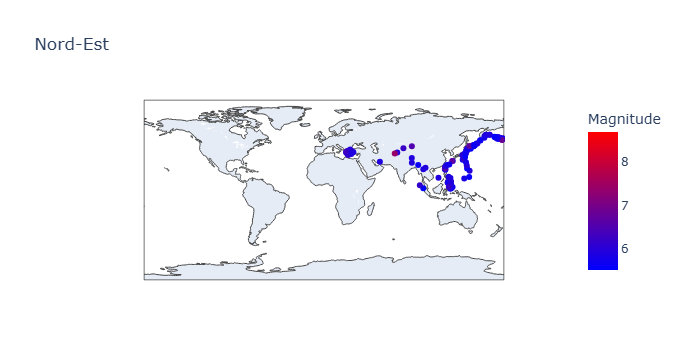

In [ ]:
def REGION(year, i):
    x = Year_statistics(year)
    r1 = x[(x['Latitude'] > 0) & (x['Longitude'] > 0)]
    r2 = x[(x['Latitude'] > 0) & (x['Longitude'] < 0)]
    r3 = x[(x['Latitude'] < 0) & (x['Longitude'] > 0)]
    r4 = x[(x['Latitude'] < 0) & (x['Longitude'] < 0)]

    f = (len(r1) * 100) / len(x)
    y = (len(r2) * 100) / len(x)
    z = (len(r3) * 100) / len(x)
    t = (len(r4) * 100) / len(x)
    p2 = px.scatter_geo(data_frame=r1,
                        lon='Longitude', lat='Latitude',
                        color='Magnitude',
                        color_continuous_scale='Bluered',
                        title='Nord-Est')
    p1 = px.pie(values=[f, y, z, t],
                names=['Nord-Est', 'Nord-Ouest', 'Sud-Est', 'Sud-Ouest'],
                title="Distribution des Tremblements en Fonction <br> de l'équateur et du méridien de Greenwich",
                color_discrete_sequence=['blue', 'red', 'lime', 'purple'])
    p1.update_layout(
    paper_bgcolor="black",  # Fond de la figure
    plot_bgcolor="black",   # Fond du graphe
    font=dict(color="white"),# Texte en blanc pour une meilleure lisibilité
    title={
        'text': "Distribution des Tremblements de Terre En <br>Fonction de l'Équateur et du Méridien de Greenwich ",  # Texte du titre
        'font': {'size': 10}          # Taille du titre
    }
)
    data['Day'] = data['Date'].dt.day

    moyenne_profondeur = x.groupby(['Day']).agg({'Depth': 'mean'}).reset_index()

    if i == 1:
        return p1
    if i==2 :
        return p2


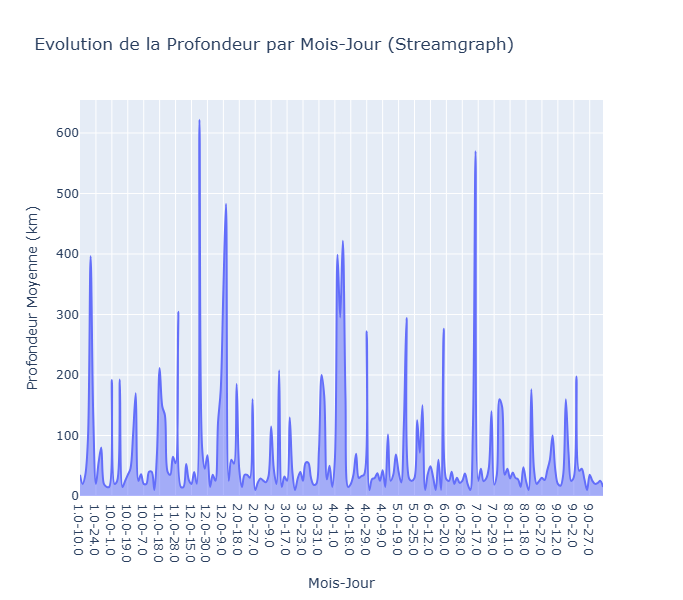

In [ ]:
# Extraire les informations de jour et de mois
data['Day'] = data['Date'].dt.day
data['Month'] = data['Date'].dt.month

# Combiner le mois et le jour dans une nouvelle colonne au format "Mois-Jour"
data['Month-Day'] = data['Month'].astype(str) + '-' + data['Day'].astype(str)

# Calculer la profondeur moyenne par "Mois-Jour"
x = Year_statistics(1965)
moyenne_profondeur = x.groupby(['Month-Day']).agg({'Depth': 'mean'}).reset_index()

# Créer le graphique
p14 = go.Figure()
p14.add_trace(go.Scatter(
    x=moyenne_profondeur['Month-Day'],  # Axe X : Mois-Jour
    y=moyenne_profondeur['Depth'],     # Axe Y : Profondeur moyenne
    fill='tonexty',
    line_shape='spline',
    mode='lines',
    name='Profondeur (km)'
))
p14.update_layout(
    title='Evolution de la Profondeur par Mois-Jour (Streamgraph)',
    height=600,
    xaxis_title="Mois-Jour",
    yaxis_title="Profondeur Moyenne (km)"
)
p14.show()


In [ ]:
pip install dash

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install jupyter_dash

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
from jupyter_dash import JupyterDash
from dash.dependencies import Input, Output


In [ ]:
import pandas as pd


# Define regions based on latitude and longitude
def assign_region(row):
    if row['Latitude'] > 0 and row['Longitude'] > 0:
        return 'Northeast (NE)'
    elif row['Latitude'] > 0 and row['Longitude'] < 0:
        return 'Northwest (NW)'
    elif row['Latitude'] < 0 and row['Longitude'] > 0:
        return 'Southeast (SE)'
    elif row['Latitude'] < 0 and row['Longitude'] < 0:
        return 'Southwest (SW)'
    else:
        return 'Equator/Prime Meridian'

# Apply the function to the dataframe
data['region'] = data.apply(assign_region, axis=1)

# Calculate the average magnitude or depth for each region
region_avg = data.groupby('region').agg({'Magnitude': 'mean', 'Depth': 'mean'}).reset_index()

# View the result
print(region_avg)


                   region  Magnitude       Depth
0  Equator/Prime Meridian   5.500000   33.000000
1          Northeast (NE)   5.890066   61.034440
2          Northwest (NW)   5.897509   32.499318
3          Southeast (SE)   5.896402   69.182415
4          Southwest (SW)   5.848573  104.396205


In [ ]:
print(region_avg.columns)


Index(['region', 'Magnitude', 'Depth'], dtype='object')


C:\Users\cheba\AppData\Local\Temp\ipykernel_7892\1292677449.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



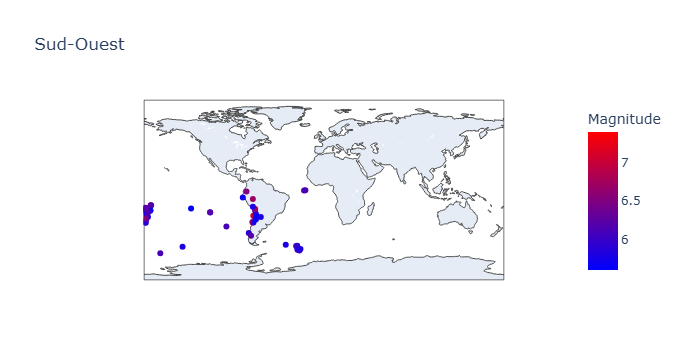

In [ ]:
import plotly.express as px

def REGION(year, i):
    # Assuming 'Year_statistics' is a function that returns a dataframe
    x = Year_statistics(year)

    # Split the data into regions based on latitude and longitude
    r1 = x[(x['Latitude'] > 0) & (x['Longitude'] > 0)]  # Northeast
    r2 = x[(x['Latitude'] > 0) & (x['Longitude'] < 0)]  # Northwest
    r3 = x[(x['Latitude'] < 0) & (x['Longitude'] > 0)]  # Southeast
    r4 = x[(x['Latitude'] < 0) & (x['Longitude'] < 0)]  # Southwest

    # Calculate percentages for the pie chart
    f = (len(r1) * 100) / len(x)
    y = (len(r2) * 100) / len(x)
    z = (len(r3) * 100) / len(x)
    t = (len(r4) * 100) / len(x)

    # Create the pie chart for regional distribution
    p1 = px.pie(values=[f, y, z, t],
                names=['Nord-Est', 'Nord-Ouest', 'Sud-Est', 'Sud-Ouest'],
                title="Distribution des Tremblements en Fonction <br> de l'Équateur et du Méridien de Greenwich",
                color_discrete_sequence=['blue', 'red', 'lime', 'purple'])

    p1.update_layout(
        paper_bgcolor="black",  # Background color of the figure
        plot_bgcolor="black",   # Background color of the plot
        font=dict(color="white"),  # Text color set to white for better visibility
        title={
            'text': "Distribution des Tremblements de Terre En <br>Fonction de l'Équateur et du Méridien de Greenwich ",
            'font': {'size': 10}  # Font size for the title
        }
    )

    # Calculate the average depth per day
    x['Day'] = x['Date'].dt.day
    moyenne_profondeur = x.groupby(['Day']).agg({'Depth': 'mean'}).reset_index()

    # Create the scatter plot for Northeast region (r1)
    p2 = px.scatter_geo(data_frame=r1,
                        lon='Longitude', lat='Latitude',
                        color='Magnitude',
                        color_continuous_scale='Bluered',
                        title='Nord-Est')

    # Create the scatter plot for Northwest region (r2)
    p3 = px.scatter_geo(data_frame=r2,
                        lon='Longitude', lat='Latitude',
                        color='Magnitude',
                        color_continuous_scale='Bluered',
                        title='Nord-Ouest')

    # Create the scatter plot for Southeast region (r3)
    p4 = px.scatter_geo(data_frame=r3,
                        lon='Longitude', lat='Latitude',
                        color='Magnitude',
                        color_continuous_scale='Bluered',
                        title='Sud-Est')

    # Create the scatter plot for Southwest region (r4)
    p5 = px.scatter_geo(data_frame=r4,
                        lon='Longitude', lat='Latitude',
                        color='Magnitude',
                        color_continuous_scale='Bluered',
                        title='Sud-Ouest')

    # Return the corresponding plot based on the value of 'i'
    if i == 1:
        return p1  # Return the pie chart
    elif i == 2:
        return p2  # Return the scatter plot for Nord-Est
    elif i == 3:
        return p3  # Return the scatter plot for Nord-Ouest
    elif i == 4:
        return p4  # Return the scatter plot for Sud-Est
    elif i == 5:
        return p5  # Return the scatter plot for Sud-Ouest

# Example usage:
REGION(1965, 5)  # Pie chart for regional distribution



In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output

# Initialisation de l'application Dash
app = dash.Dash(__name__, suppress_callback_exceptions=True)

# Navbar (already defined)
navbar = html.Div([
    html.Div([
        dcc.Link('Vue Globale | ', href='/', style={
            'font-size': '18px',
            'color': 'white',
            'text-decoration': 'none',
            'padding': '15px 25px',
            'display': 'inline-block',
            'font-weight': 'bold',
            'transition': 'all 0.3s ease',
        }),
        dcc.Link('Informations Annuelles', href='/stats-par-annee', style={
            'font-size': '18px',
            'color': 'white',
            'text-decoration': 'none',
            'padding': '15px 25px',
            'display': 'inline-block',
            'font-weight': 'bold',
            'transition': 'all 0.3s ease',
        }),
    ], style={
        'display': 'flex',
        'justify-content': 'center',
        'align-items': 'center',
        'background-color': '#222222',
        'box-shadow': '0 4px 6px rgba(0, 0, 0, 0.1)',
        'padding': '10px 0',
        'border-radius': '8px',
        'margin-bottom': '20px',
        'position': 'fixed',
        'top': '0',
        'left': '0',
        'width': '100%',
        'z-index': '1000',
    })
])

# Main content layout
app.layout = html.Div(
    children=[
        dcc.Location(id='url', refresh=False),  # Needed for page routing
        navbar,
        html.H3([
            'Bienvenue sur le tableau de bord des séismes,',
            html.Br(),
            'Ce tableau de bord fournit des informations sur l\'activité sismique mondiale de 1965 à 2016.'
        ], style={'color': 'white', 'textAlign': 'center', 'padding-top': '100px'}),  # Adjusted padding

        html.Div(id='page-content')  # Dynamic page area
    ],
    style={'background-color': 'black'}
)

# Page 1 (Tableau de bord principal)
page1_layout = html.Div([
    html.Div([
        dcc.Graph(id='max_d', figure=gauge_max_depth)
    ], style={'width': '25%', 'height': '25%', 'display': 'inline-block'}),

    html.Div([
        dcc.Graph(id='min_d', figure=gauge_depth_min)
    ], style={'width': '25%', 'height': '25%', 'display': 'inline-block'}),

    html.Div([
        dcc.Graph(id='min_mag', figure=gauge_min_magnitude)
    ], style={'width': '25%', 'height': '25%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='max_m', figure=gauge_max_magnitude)
    ], style={'width': '25%', 'height': '25%', 'display': 'inline-block'}),

    html.Div([
        dcc.Graph(id='v2', figure=v2)
    ], style={'width': '30%', 'height': '25%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='f', figure=f)
    ], style={'width': '35%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='v3', figure=v3)
    ], style={'width': '35%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='v4', figure=v4)
    ], style={'width': '35%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='v6', figure=v6)
    ], style={'width': '65%', 'display': 'inline-block'}),
    html.Div([
        dcc.Graph(id='v5', figure=fig_depth_magnitude)
    ], style={'width': '40%', 'display': 'inline-block'}),

    html.Div([
        dcc.Graph(id='v7', figure=v7)
    ], style={'width': '60%', 'display': 'inline-block'})
])


page2_layout = html.Div([
    html.Div([

        html.H3('Choisissez les paramètres pour voir les données sismiques', style={
            'color': 'white',
            'textAlign': 'center',
            'marginBottom': '30px',
            'fontSize': '24px'
        }),


        html.Div([
            dcc.Dropdown(
                id='year-dropdown',
                options=[{'label': str(year), 'value': year} for year in range(1965, 2017)],
                value=1965,
                style={
                    'backgroundColor': 'skyblue',
                    'color': 'black',
                    'fontSize': '16px',
                    'width': '250px',
                    'margin': '0 auto',
                    'display': 'block',
                    'borderRadius': '10px',
                    'boxShadow': '0 4px 8px rgba(0, 0, 0, 0.1)'
                }
            ),
        ], style={'marginBottom': '30px', 'textAlign': 'center'}),


        html.Div([
            dcc.RadioItems(
                id='detail-choice',
                options=[
                    {'label': 'Vue Annuelle', 'value': 'annual'},
                    {'label': 'Vue Mensuelle', 'value': 'monthly'},
                    {'label': 'Vue Mensuelle/Journalière', 'value': 'monthly-daily'}
                ],
                value='annual',  # Option par défaut
                labelStyle={'display': 'inline-block', 'marginRight': '20px', 'color': 'white', 'fontSize': '18px'},
                style={'textAlign': 'center', 'marginBottom': '30px'}
            ),
        ], style={'marginBottom': '30px'}),

        html.Div(id='main-info', style={
            'color': 'white',
            'textAlign': 'center',
            'fontSize': '18px',
            'marginBottom': '30px'
        }),

        html.Div([
            dcc.Dropdown(
                id='month-dropdown',
                options=[{'label': f"{month:02d}", 'value': month} for month in range(1, 13)],
                placeholder="Sélectionnez un mois",
                style={
                    'width': '250px',
                    'display': 'none',
                    'margin': '0 auto',
                    'borderRadius': '10px',
                    'boxShadow': '0 4px 8px rgba(0, 0, 0, 0.1)'
                }
            ),
            dcc.Dropdown(
                id='day-dropdown',
                options=[{'label': str(day), 'value': day} for day in range(1, 32)],
                placeholder="Sélectionnez un jour",
                style={
                    'width': '250px',
                    'display': 'none',
                    'margin': '0 auto',
                    'borderRadius': '10px',
                    'boxShadow': '0 4px 8px rgba(0, 0, 0, 0.1)'
                }
            ),
        ], style={'textAlign': 'center', 'marginBottom': '30px'}),

        # Output Area for Year Stats
        html.Div(id='output-year-stats', style={
            'color': 'white',
            'textAlign': 'center',
            'fontSize': '18px',
            'marginBottom': '30px'
        }),

        html.Div([
            html.Div([
                dcc.Graph(
                    id='max_pro',
                    figure=gauge(1965, 'max_depth')
                )
            ], style={'width': '23%', 'display': 'inline-block', 'margin': '0 1%'}),
            html.Div([
                dcc.Graph(
                    id='min_pro',
                    figure=gauge(1965, 'min_depth')
                )
            ], style={'width': '23%', 'display': 'inline-block', 'margin': '0 1%'}),
            html.Div([
                dcc.Graph(
                    id='max_mg',
                    figure=gauge(1965, 'max_magnitude')
                )
            ], style={'width': '23%', 'display': 'inline-block', 'margin': '0 1%'}),
            html.Div([
                dcc.Graph(
                    id='min_mg',
                    figure=gauge(1965, 'min_magnitude')
                )
            ], style={'width': '23%', 'display': 'inline-block', 'margin': '0 1%'}),
        ], style={'textAlign': 'center', 'marginBottom': '40px'}),

        html.Div([
            html.Div([
                dcc.Graph(
                    id='month',
                    figure=month(1965)
                )
            ], style={'width': '48%', 'display': 'inline-block', 'marginRight': '2%'}),
            html.Div([
                dcc.Graph(
                    id='p1',
                    figure=REGION(1965, 1)
                )
            ], style={'width': '48%', 'display': 'inline-block', 'marginLeft': '2%'})
        ], style={'textAlign': 'center'}),

    ], style={
        'backgroundColor': 'black',
        'padding': '40px 20px',
        'borderRadius': '10px',
        'boxShadow': '0 4px 10px rgba(0, 0, 0, 0.2)'
    }),

], style={'backgroundColor': 'black', 'padding': '40px'})






# Callback for page navigation
@app.callback(
    Output('page-content', 'children'),
    [Input('url', 'pathname')]
)
def display_page(pathname):
    if pathname == '/stats-par-annee':
        return page2_layout
    else:
        return page1_layout

# Callback for updating statistics
@app.callback(
    [Output('output-year-stats', 'children'),
     Output('month-dropdown', 'style'),
     Output('day-dropdown', 'style')],
    [Input('year-dropdown', 'value'),
     Input('detail-choice', 'value'),
     Input('month-dropdown', 'value'),
     Input('day-dropdown', 'value')]
)
def update_stats(selected_year, detail_choice, selected_month, selected_day):
    if detail_choice == 'annual':
        return f'Statistiques pour l\'année {selected_year}', {'display': 'none'}, {'display': 'none'}
    elif detail_choice == 'monthly':
        return f'Statistiques pour {selected_month}/{selected_year}', {'display': 'block'}, {'display': 'none'}
    elif detail_choice == 'monthly-daily':
        return f'Statistiques pour le {selected_day}/{selected_month}/{selected_year}', {'display': 'block'}, {'display': 'block'}
    return 'Sélection invalide.', {'display': 'none'}, {'display': 'none'}

# Callback to update figures
@app.callback(
    [
        Output('max_pro', 'figure'),
        Output('min_pro', 'figure'),
        Output('max_mg', 'figure'),
        Output('min_mg', 'figure'),
        Output('month', 'figure'),
        Output('p1', 'figure')
    ],
    [Input('year-dropdown', 'value')]
)
def update_graphs(selected_year):
    return (
        gauge(selected_year, 'max_depth'),
        gauge(selected_year, 'max_magnitude'),
        gauge(selected_year, 'min_magnitude'),
        gauge(selected_year, 'min_depth'),
        month(selected_year),
        REGION(selected_year, 1)
    )

# Run the Dash server
if __name__ == '__main__':
    app.run_server(debug=True, port=8052)